In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)
from sklearn import preprocessing
from sklearn.decomposition import PCA

In [4]:
df = pd.read_csv('fifa_modified1.csv')

In [5]:
df.head()

,sofifa_id,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,team_jersey_number,contract_valid_until,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
0,158023,L. Messi,32,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,10.0,2021.0,12.114565,87.000000,92.000000,92.000000,96.000000,39.000000,66.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8
1,20801,Cristiano Ronaldo,34,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,7.0,2022.0,7.000000,90.000000,93.000000,82.000000,89.000000,35.000000,78.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11
2,190871,Neymar Jr,27,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,10.0,2022.0,10.000000,91.000000,85.000000,87.000000,95.000000,32.000000,58.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11
3,200389,J. Oblak,26,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,13.0,2023.0,1.000000,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,87.000000,92.000000,78.000000,89.000000,52.000000,90.000000,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89
4,183277,E. Hazard,28,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,184500000.0,7.0,2024.0,10.000000,91.000000,83.000000,86.000000,94.000000,35.000000,66.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8


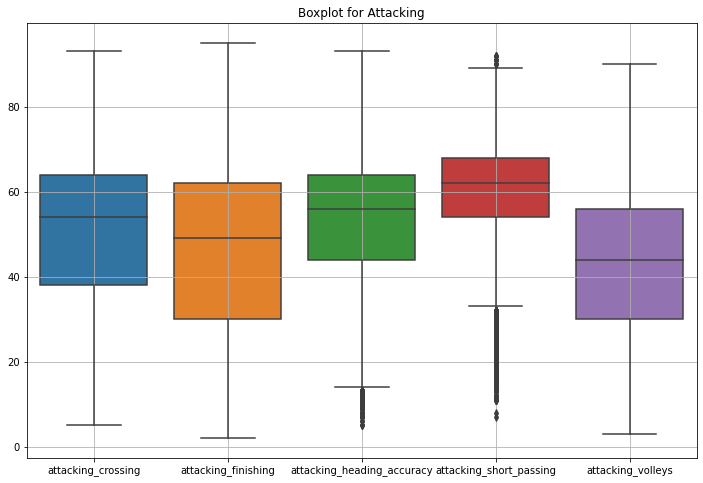

In [6]:
plt.figure(figsize=(12,8))
sns.boxplot(data=df[['attacking_crossing','attacking_finishing','attacking_heading_accuracy','attacking_short_passing','attacking_volleys']])
plt.title("Boxplot for Attacking")
plt.grid()

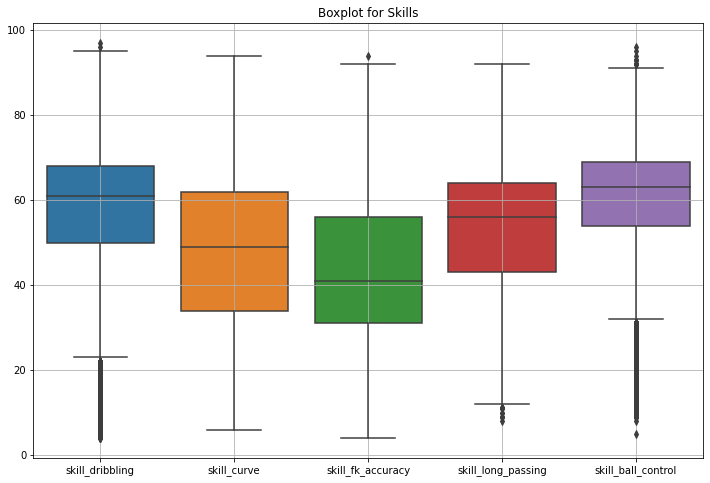

In [7]:
plt.figure(figsize=(12,8))
sns.boxplot(data=df[['skill_dribbling','skill_curve','skill_fk_accuracy','skill_long_passing','skill_ball_control']])
plt.title("Boxplot for Skills")
plt.grid()

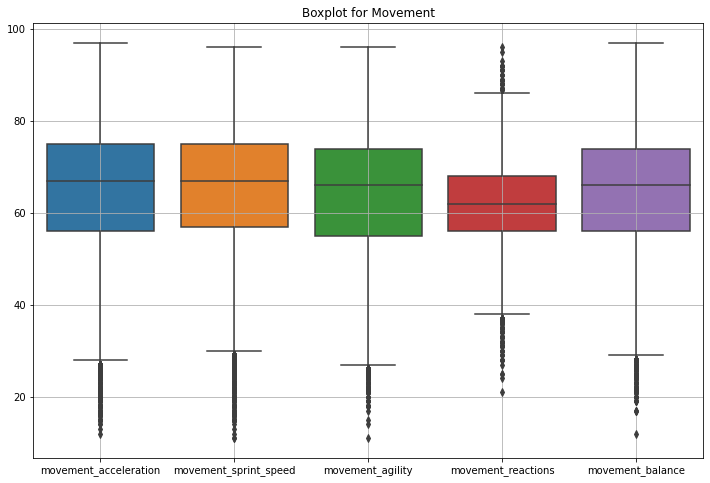

In [8]:
plt.figure(figsize=(12,8))
plt.title("Boxplot for Movement")
sns.boxplot(data=df[['movement_acceleration','movement_sprint_speed','movement_agility','movement_reactions','movement_balance']])
plt.grid()

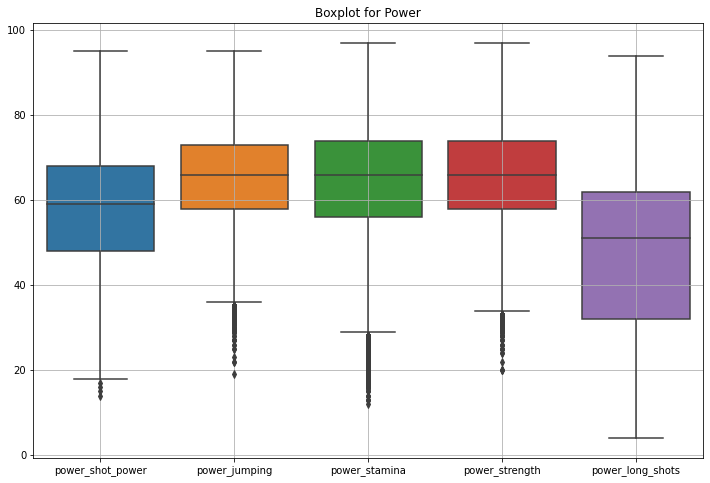

In [9]:
plt.figure(figsize=(12,8))
plt.title("Boxplot for Power")
sns.boxplot(data=df[['power_shot_power','power_jumping','power_stamina','power_strength','power_long_shots']])
plt.grid()

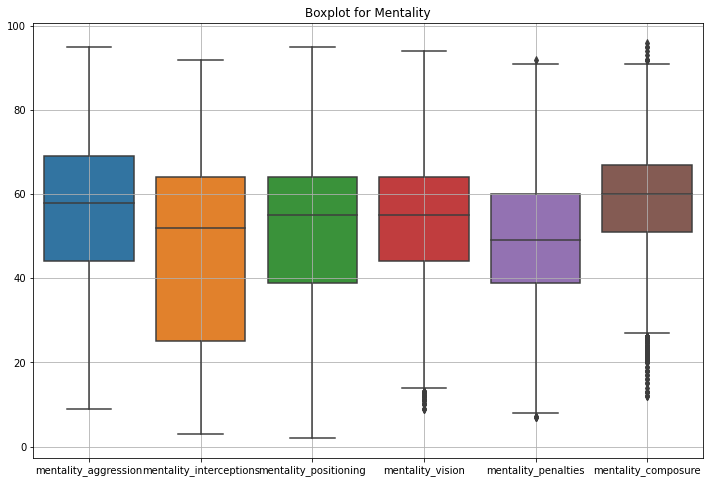

In [10]:
mentality= ['mentality_aggression','mentality_interceptions','mentality_positioning','mentality_vision','mentality_penalties','mentality_composure']
plt.figure(figsize=(12,8))
plt.title("Boxplot for Mentality")
sns.boxplot(data=df[mentality])
plt.grid()

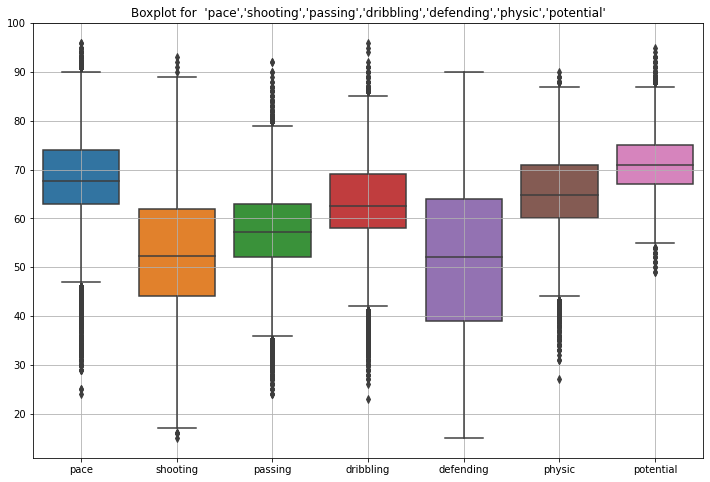

In [11]:
# other skills
plt.figure(figsize=(12,8))
plt.title("Boxplot for  'pace','shooting','passing','dribbling','defending','physic','potential'")
sns.boxplot(data=df[['pace','shooting','passing','dribbling','defending','physic','potential']])
plt.grid()

In [12]:
# Some columns have outliers because some player good at shooting
# some are good at goalkeeping and some are good at defending 
# So in the conclusion we can not remove these data it is an important information

In [13]:
from sklearn.cluster import KMeans

In [14]:
df = pd.read_csv('fifa_modified1.csv')

In [15]:
df.head()

,sofifa_id,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,team_jersey_number,contract_valid_until,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
0,158023,L. Messi,32,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,10.0,2021.0,12.114565,87.000000,92.000000,92.000000,96.000000,39.000000,66.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8
1,20801,Cristiano Ronaldo,34,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,7.0,2022.0,7.000000,90.000000,93.000000,82.000000,89.000000,35.000000,78.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11
2,190871,Neymar Jr,27,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,10.0,2022.0,10.000000,91.000000,85.000000,87.000000,95.000000,32.000000,58.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11
3,200389,J. Oblak,26,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,13.0,2023.0,1.000000,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,87.000000,92.000000,78.000000,89.000000,52.000000,90.000000,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89
4,183277,E. Hazard,28,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,184500000.0,7.0,2024.0,10.000000,91.000000,83.000000,86.000000,94.000000,35.000000,66.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8


In [16]:
df.drop(columns=['sofifa_id','nationality','club','player_positions','preferred_foot','work_rate','body_type','real_face'],inplace=True)

In [17]:
df.head()

,short_name,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,release_clause_eur,team_jersey_number,contract_valid_until,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
0,L. Messi,32,170,72,94,94,95500000,565000,5,4,4,195800000.0,10.0,2021.0,12.114565,87.000000,92.000000,92.000000,96.000000,39.000000,66.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8
1,Cristiano Ronaldo,34,187,83,93,93,58500000,405000,5,4,5,96500000.0,7.0,2022.0,7.000000,90.000000,93.000000,82.000000,89.000000,35.000000,78.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11
2,Neymar Jr,27,175,68,92,92,105500000,290000,5,5,5,195200000.0,10.0,2022.0,10.000000,91.000000,85.000000,87.000000,95.000000,32.000000,58.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11
3,J. Oblak,26,188,87,91,93,77500000,125000,3,3,1,164700000.0,13.0,2023.0,1.000000,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,87.000000,92.000000,78.000000,89.000000,52.000000,90.000000,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89
4,E. Hazard,28,175,74,91,91,90000000,470000,4,4,4,184500000.0,7.0,2024.0,10.000000,91.000000,83.000000,86.000000,94.000000,35.000000,66.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8


In [18]:
# first testing clustering on players having overall rating greater than 86
# we can call it sample analysis
df = df[df.overall>86]
df

,short_name,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,release_clause_eur,team_jersey_number,contract_valid_until,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
0,L. Messi,32,170,72,94,94,95500000,565000,5,4,4,195800000.0,10.0,2021.0,12.114565,87.000000,92.000000,92.000000,96.000000,39.000000,66.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8
1,Cristiano Ronaldo,34,187,83,93,93,58500000,405000,5,4,5,96500000.0,7.0,2022.0,7.000000,90.000000,93.000000,82.000000,89.000000,35.000000,78.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11
2,Neymar Jr,27,175,68,92,92,105500000,290000,5,5,5,195200000.0,10.0,2022.0,10.000000,91.000000,85.000000,87.000000,95.000000,32.000000,58.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11
3,J. Oblak,26,188,87,91,93,77500000,125000,3,3,1,164700000.0,13.0,2023.0,1.000000,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,87.000000,92.000000,78.000000,89.000000,52.000000,90.000000,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89
4,E. Hazard,28,175,74,91,91,90000000,470000,4,4,4,184500000.0,7.0,2024.0,10.000000,91.000000,83.000000,86.000000,94.000000,35.000000,66.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8
5,K. De Bruyne,28,181,70,91,91,90000000,370000,4,5,4,166500000.0,17.0,2023.0,7.000000,76.000000,86.000000,92.000000,86.000000,61.000000,78.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,93,82,55,92,82,86,85,83,91,91,77,76,78,91,76,91,63,89,74,90,76,61,88,94,79,91,68,58,51,15,13,5,10,13
6,M. ter Stegen,27,187,85,90,93,67500000,250000,3,4,1,143400000.0,1.0,2022.0,22.000000,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,88.000000,85.000000,88.000000,90.000000,45.000000,88.000000,18,14,11,61,14,21,18,12,63,30,38,50,37,86,43,66,79,35,78,10,43,22,11,70,25,70,25,13,10,88,85,88,88,90
7,V. van Dijk,27,193,92,90,91,78000000,200000,3,3,2,150200000.0,4.0,2023.0,4.000000,77.000000,60.000000,70.000000,71.000000,90.000000,86.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,53,52,86,78,45,70,60,70,81,76,74,79,61,88,53,81,90,75,92,64,82,89,47,65,62,89,91,92,85,13,10,13,11,11
8,L. Modrić,33,172,66,90,90,45000000,340000,4,4,4,92300000.0,10.0,2020.0,12.114565,74.000000,76.000000,89.000000,89.000000,72.000000,66.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,86,72,55,92,76,87,85,78,88,92,77,71,92,89,93,79,68,85,58,82,62,82,79,91,82,92,68,76,71,13,9,7,14,9
9,M. Salah,27,175,71,90,90,80500000,240000,3,3,4,148900000.0,11.0,2023.0,10.000000,93.000000,86.000000,81.000000,89.000000,45.000000,74.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,79,90,59,84,79,89,83,69,75,89,94,92,91,92,88,80,69,85,73,84,63,55,9

In [19]:
names = df.short_name.tolist()
df.drop(columns=['short_name'],inplace=True)

In [20]:
df.shape

(55, 60)

In [21]:
# Normalize(Rescale the data)
# since some columns like wage_eur, value_eur,release_clause_eur have very high values 10000-1000000
# whereas some columns like international_reputation,weak_foot,skill_moves have values 0-5
# There for model can be biased towords higher values 
# Conclusion :- it is good to normalize data to prevent model from overfitting

In [22]:
x= df.values
scaler = preprocessing.MinMaxScaler()
x_scaled = scaler.fit_transform(x)
X_norm= pd.DataFrame(x_scaled)

In [23]:
# since 60 columns means a lot to a model therfore model might not perform well
# hence reducing 60 columns to 2 columns

In [24]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
reduced = pd.DataFrame(pca.fit_transform(X_norm))

In [25]:
# performing Kmeans clustering

In [26]:
kmeans = KMeans(n_clusters=5)
# fit input data
kmeans = kmeans.fit(reduced)
# get the cluster labels
labels = kmeans.predict(reduced)
# centroid values
centroid = kmeans.cluster_centers_
# cluster values
cluster = kmeans.labels_.tolist()

C:\Users\user\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\user\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [27]:
reduced['cluster'] = cluster
reduced['name'] = names
reduced.columns=['x','y','cluster','name']
reduced.head()

,x,y,cluster,name
0,-1.528319,-1.358693,1,L. Messi
1,-1.233176,-0.952752,1,Cristiano Ronaldo
2,-1.349761,-1.526103,1,Neymar Jr
3,3.513043,-0.673008,0,J. Oblak
4,-1.248611,-1.301530,1,E. Hazard


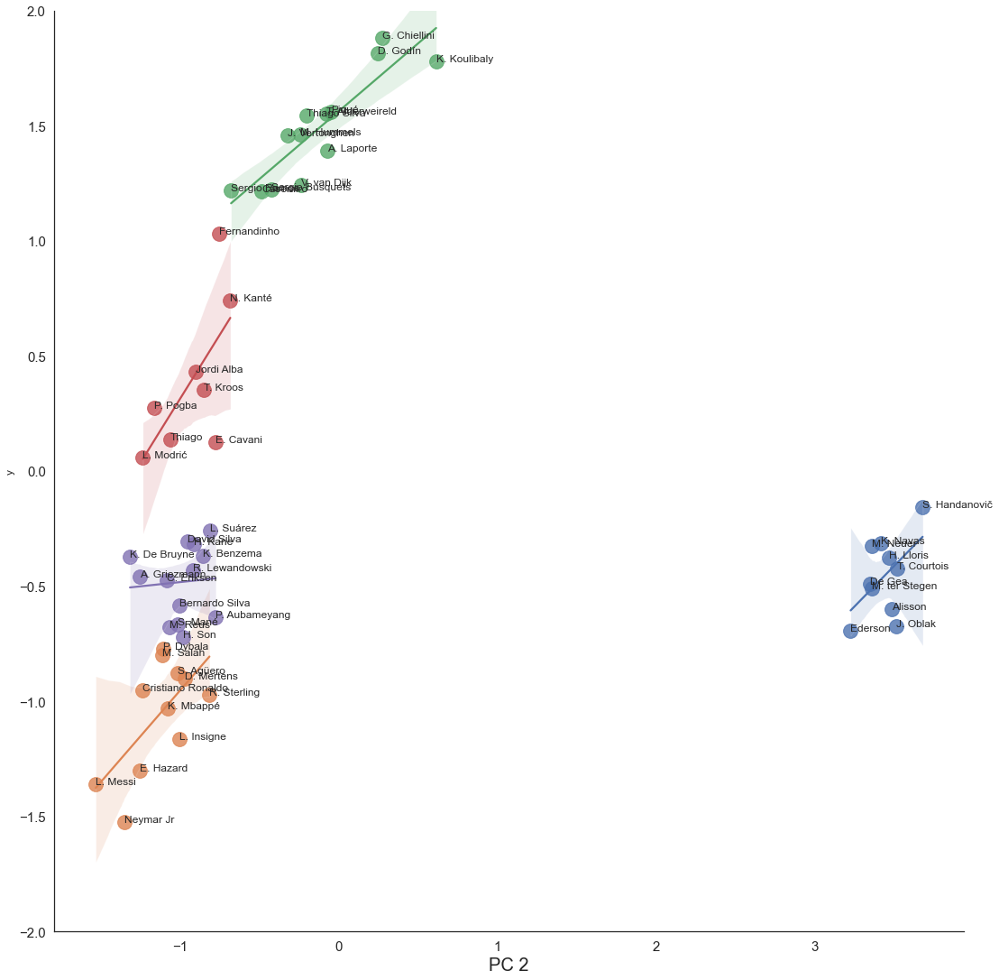

In [28]:
sns.set(style='white')
ax = sns.lmplot(x='x',y='y',hue='cluster',data=reduced,legend = False,height=15,scatter_kws={'s':250})
texts = []
for x,y,s in zip(reduced.x,reduced.y,reduced.name):
    texts.append(plt.text(x,y,s))

ax.set(ylim=(-2,2))
plt.tick_params(labelsize=15)
plt.xlabel('PC 1',fontsize=20)
plt.xlabel('PC 2',fontsize=20)
plt.show()

## Now clustering on complete dataset
## Note This clustering on complete data and it is not biased towards any attribute

In [29]:
# using Silhouette score for finding best number for clusters
# The value of the Silhouette score ranges from -1 to 1. Following is the interpretation of the Silhouette score.

# 1: Points are perfectly assigned in a cluster and clusters are easily distinguishable.
# 0: Clusters are overlapping.
# -1: Points are wrongly assigned in a cluster.

In [30]:
df = pd.read_csv('fifa_modified1.csv')
names = df.short_name.tolist()
# df.drop(columns=['short_name'],inplace=True)
names
def read_normaliz_pca(scaler,n_columns=10,df=None):
    if df is None:
        df = pd.read_csv('fifa_modified1.csv')
    df.drop(columns=['sofifa_id','nationality','club','player_positions',
                         'preferred_foot','work_rate','body_type','real_face'],inplace=True)
    
    names = df.short_name.tolist()
    df.drop(columns=['short_name'],inplace=True)
    
    # Normalize(Rescale the data)
    # since some columns like wage_eur, value_eur,release_clause_eur have very high values 10000-1000000
    # whereas some columns like international_reputation,weak_foot,skill_moves have values 0-5
    # There for model can be biased towords higher values 
    # Conclusion :- it is good to normalize data to prevent model from overfitting
    x= df.values
    
    x_scaled = scaler.fit_transform(x)
    X_norm= pd.DataFrame(x_scaled)
     
    # since 60 columns means a lot to a model therfore model might not perform well and overfit
    # hence reducing number of columns to n_columns
    pca = PCA(n_components=n_columns)
    reduced = pd.DataFrame(pca.fit_transform(X_norm))
    return reduced

In [31]:
scaler = preprocessing.MinMaxScaler()
reduced = read_normaliz_pca(scaler,n_columns=3)

In [32]:
def cluster_analysis(reduced,number_of_clusters:'should be even'=10):
    import sklearn
    from yellowbrick.cluster import SilhouetteVisualizer
    from sklearn.metrics import silhouette_score
    from sklearn.cluster import KMeans

    X = reduced

    fig, ax = plt.subplots(round((number_of_clusters-2)/2), 2, figsize=(15,8))
    for n_clusters in range(2,number_of_clusters):
        '''
        Create KMeans instances for different number of clusters
        '''
        kmeans = KMeans(n_clusters=n_clusters, init='k-means++', n_init=10, max_iter=100, random_state=42)
        q, mod = divmod(n_clusters, 2)
        '''
        Create SilhouetteVisualizer instance with KMeans instance
        Fit the visualizer
        '''

        visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick', ax=ax[q-1][mod])
        visualizer.fit(X)

        cluster_labels = kmeans.fit_predict(reduced)
        sil_val = sklearn.metrics.silhouette_score(reduced,cluster_labels,metric='euclidean', random_state=10)

        print(f"for {n_clusters} clusters silhoutte value is {sil_val} ")

for 2 clusters silhoutte value is 0.6112096401431384 
for 3 clusters silhoutte value is 0.40885648005079556 
for 4 clusters silhoutte value is 0.4329344390716982 
for 5 clusters silhoutte value is 0.4132226080712695 
for 6 clusters silhoutte value is 0.38651360674490415 
for 7 clusters silhoutte value is 0.3892347990921996 
for 8 clusters silhoutte value is 0.3756142179731735 
for 9 clusters silhoutte value is 0.37217515487959124 
for 10 clusters silhoutte value is 0.3688668959655293 
for 11 clusters silhoutte value is 0.3273656390079498 
for 12 clusters silhoutte value is 0.32218340855676997 
for 13 clusters silhoutte value is 0.3095788401377269 
for 14 clusters silhoutte value is 0.3121331506957749 
for 15 clusters silhoutte value is 0.308941993864618 
for 16 clusters silhoutte value is 0.3064512814727172 
for 17 clusters silhoutte value is 0.30188165040398135 
for 18 clusters silhoutte value is 0.29591404013391936 
for 19 clusters silhoutte value is 0.300969271798316 


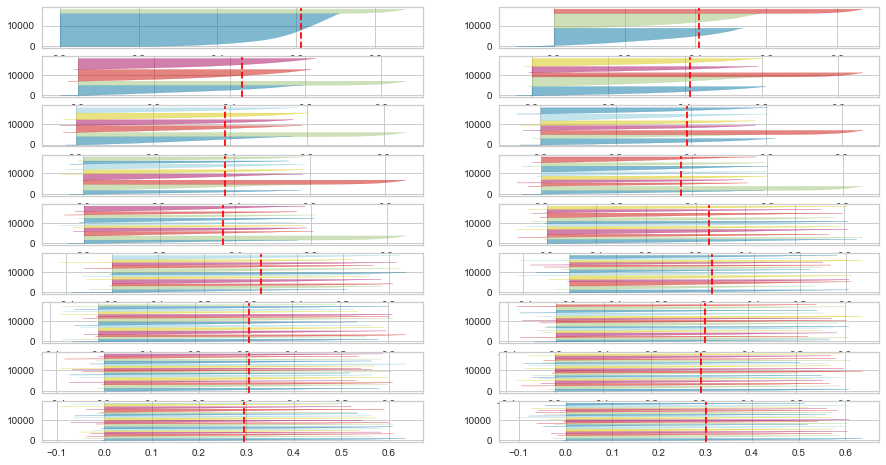

In [33]:
cluster_analysis(reduced,number_of_clusters=20)


In [34]:
# conclusion : for 2 clusters we are getting good segments but it is less
#  hence we choose 4 number of clusters

In [35]:
reduced.head()

,0,1,2
0,-1.862262,-1.173054,1.172353
1,-1.719352,-1.061111,1.201491
2,-1.731313,-1.316372,0.922977
3,1.839711,-0.284614,1.488981
4,-1.647686,-1.149565,0.897448


In [36]:
df = pd.read_csv('fifa_modified1.csv')
names = df.short_name.tolist()
def finalize_cluster(n_clusters,columns,data=None):
    import copy
    from sklearn.cluster import KMeans
    reduced_data=copy.deepcopy(data)
    kmeans = KMeans(n_clusters=n_clusters,init='k-means++', n_init=10, max_iter=100, random_state=42)
    # fit input data
    kmeans = kmeans.fit(reduced_data)
    # get the cluster labels
    labels = kmeans.predict(reduced_data)
    # centroid values
    centroid = kmeans.cluster_centers_
    # cluster values
    
    cluster = kmeans.labels_.tolist()
    reduced_data['cluster'] = cluster
    reduced_data['name'] = names
    reduced_data.columns=columns
    return reduced_data

In [37]:
reduced.head()

,0,1,2
0,-1.862262,-1.173054,1.172353
1,-1.719352,-1.061111,1.201491
2,-1.731313,-1.316372,0.922977
3,1.839711,-0.284614,1.488981
4,-1.647686,-1.149565,0.897448


In [38]:
columns = ['x','y','z','cluster','name']
final_data=finalize_cluster(4,columns,reduced)

In [39]:
final_data.head()

,x,y,z,cluster,name
0,-1.862262,-1.173054,1.172353,0,L. Messi
1,-1.719352,-1.061111,1.201491,0,Cristiano Ronaldo
2,-1.731313,-1.316372,0.922977,0,Neymar Jr
3,1.839711,-0.284614,1.488981,1,J. Oblak
4,-1.647686,-1.149565,0.897448,0,E. Hazard


In [40]:
def visualize_clusters(reduced):
    plt.figure(figsize=(10,10))
    sns.set(style='white')
    ax = sns.lmplot(x='x',y='y',hue='cluster',data=reduced,legend = False,height=7,scatter_kws={'s':150})


    ax.set(ylim=(-2,2))
    plt.tick_params(labelsize=15)
    plt.xlabel('PC 1',fontsize=20)
    plt.ylabel('PC 2',fontsize=20)
    plt.show()

<Figure size 720x720 with 0 Axes>

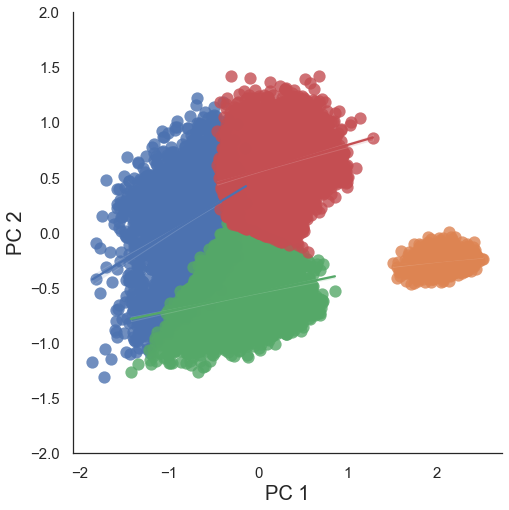

In [41]:
visualize_clusters(final_data)

In [42]:
def visualize_3D(data):
    import plotly.graph_objects as go  #for 3D plot
    reduced = data
    ## K-means using k = 4

    ## 3D plot 
    Scene = dict(xaxis = dict(title  = 'Pc1'),yaxis = dict(title  = 'Pc2'),zaxis = dict(title  = 'Pc3'))

    # labels = kmeans.labels_
    trace = go.Scatter3d(x=reduced.x, y=reduced.y, z=reduced.z,hovertext=reduced.name, mode='markers',marker=dict(color = reduced.cluster, size= 10, line=dict(color= 'black',width = 10)))
    layout = go.Layout(margin=dict(l=0,r=0),scene = Scene,height = 800,width = 800)
    data = [trace]
    fig = go.Figure(data = data, layout = layout)
    fig.show()
    

In [43]:
visualize_3D(final_data)

In [44]:
final_data.head()

,x,y,z,cluster,name
0,-1.862262,-1.173054,1.172353,0,L. Messi
1,-1.719352,-1.061111,1.201491,0,Cristiano Ronaldo
2,-1.731313,-1.316372,0.922977,0,Neymar Jr
3,1.839711,-0.284614,1.488981,1,J. Oblak
4,-1.647686,-1.149565,0.897448,0,E. Hazard


In [45]:
visualize_3D(final_data)

<Figure size 720x720 with 0 Axes>

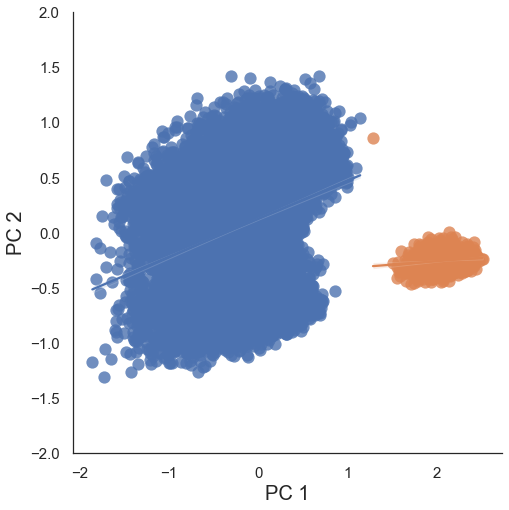

In [46]:
n_clusters=2
final_data=finalize_cluster(n_clusters,columns,reduced)
visualize_clusters(final_data)
# we can say that when number of clusters is 2 we get proper segmentation

<Figure size 720x720 with 0 Axes>

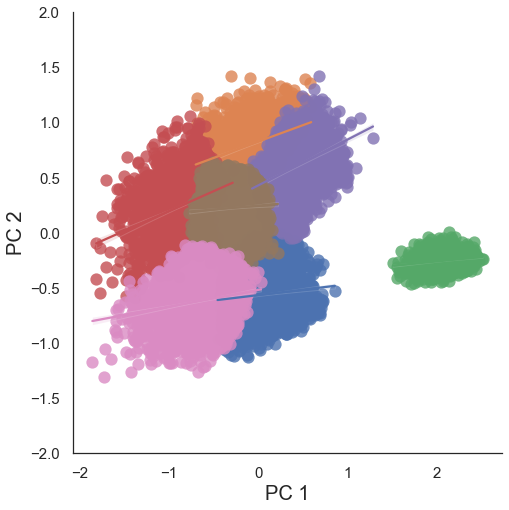

In [47]:
n_clusters=7
final_data=finalize_cluster(n_clusters,columns,reduced)
visualize_clusters(final_data)
# when number of clusters is 7 
# we also get a good result

for 2 clusters silhoutte value is 0.5016449714624233 
for 3 clusters silhoutte value is 0.2738442793612143 
for 4 clusters silhoutte value is 0.26863509219969706 
for 5 clusters silhoutte value is 0.24253697566729818 


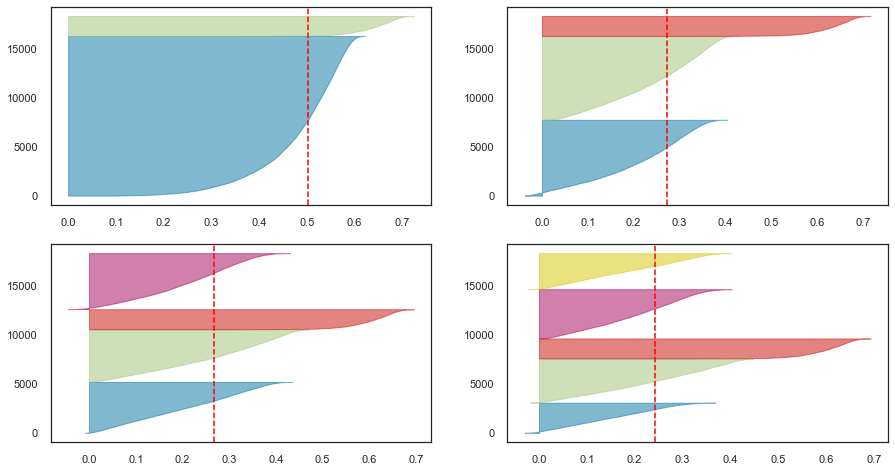

In [48]:
# reducing 60 columns to 20
scaler = preprocessing.MinMaxScaler()
reduced = read_normaliz_pca(scaler,n_columns=20)
cluster_analysis(reduced,number_of_clusters=6)
# not good result when compared to dimentional was reduced to 3

<Figure size 720x720 with 0 Axes>

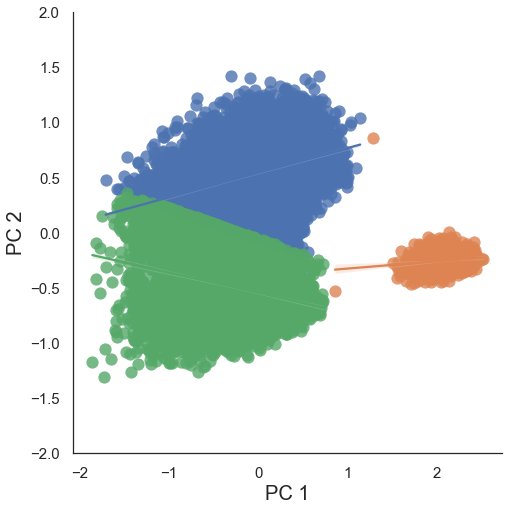

In [49]:
pca = PCA(n_components=2)
reduced1 = pd.DataFrame(pca.fit_transform(reduced))
n_clusters=3
columns = ['x','y','cluster','name']
final_data=finalize_cluster(n_clusters,columns,reduced1)
visualize_clusters(final_data)


for 2 clusters silhoutte value is 0.6390001950111415 
for 3 clusters silhoutte value is 0.477423283461556 
for 4 clusters silhoutte value is 0.47712246481316484 
for 5 clusters silhoutte value is 0.4577509338426253 


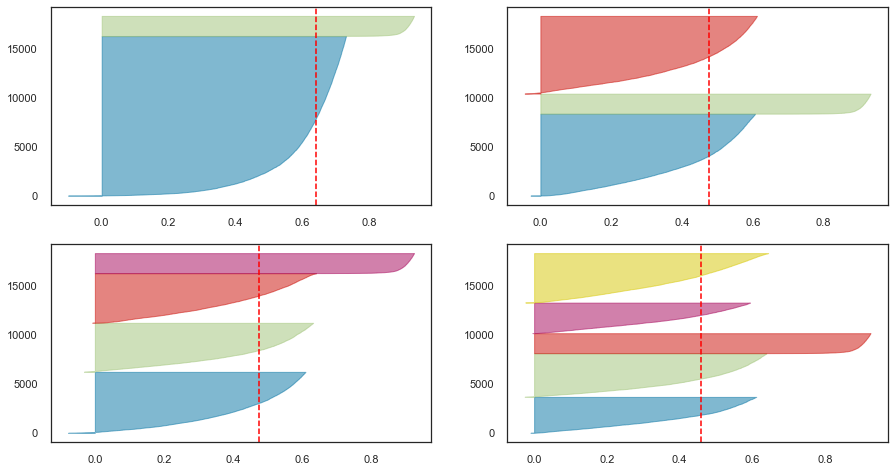

In [50]:
# reducing 60 columns to 2
scaler = preprocessing.MinMaxScaler()
reduced = read_normaliz_pca(scaler,n_columns=2)
cluster_analysis(reduced,number_of_clusters=6)

<Figure size 720x720 with 0 Axes>

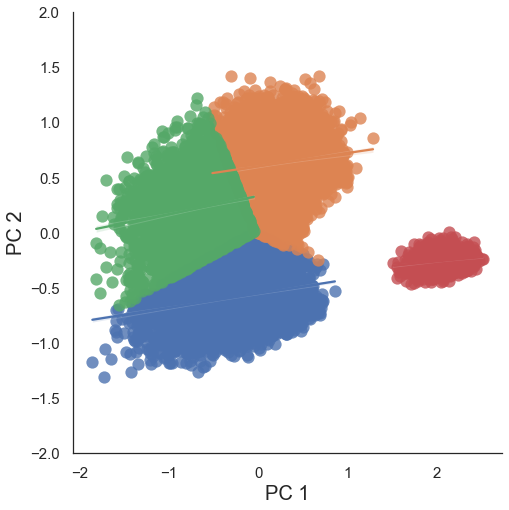

In [51]:
n_clusters=4
columns = ['x','y','cluster','name']
final_data=finalize_cluster(n_clusters,columns,reduced)
visualize_clusters(final_data)

In [52]:
# removing more columns which are highly correlated
# Bivariate Data Analysis
df = pd.read_csv('fifa_modified1.csv')
corr_matrix = df.corr()
corr_matrix

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,release_clause_eur,team_jersey_number,contract_valid_until,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
sofifa_id,1.000000,-0.736680,-0.093464,-0.203620,-0.445061,0.042015,-0.159848,-0.228084,-0.360765,-0.092250,-7.964529e-02,-0.139161,0.177227,0.143471,0.023187,1.458338e-01,-2.467105e-01,-3.306229e-01,-1.998951e-01,-2.026141e-01,-3.333713e-01,-1.700643e-01,-1.781698e-01,-1.506137e-01,-1.624510e-01,-1.487126e-01,-2.057234e-01,-0.137097,-0.098612,-0.120116,-0.146427,-0.166148,-0.045166,-0.172646,-0.200029,-0.199998,-0.110933,0.119183,0.117895,-0.032759,-0.439012,0.040989,-0.283919,-0.189141,-0.077519,-0.279780,-0.178362,-0.232305,-0.164695,-0.102409,-0.229932,-0.147125,-0.385061,-0.131479,-0.087414,-0.068464,-0.113073,-0.116270,-0.114658,-0.123064,-0.113487
age,-0.736680,1.000000,0.081391,0.237169,0.464305,-0.262872,0.081513,0.151031,0.259582,0.073988,4.527734e-02,0.063629,-0.223024,-0.121606,-0.024442,-1.850871e-01,2.198391e-01,3.040220e-01,1.489385e-01,2.391559e-01,4.004104e-01,1.654225e-01,1.796133e-01,1.558595e-01,1.612534e-01,1.301812e-01,2.118678e-01,0.128189,0.078531,0.149946,0.135681,0.143063,0.016735,0.141891,0.190419,0.184008,0.088359,-0.153145,-0.144310,-0.023131,0.463331,-0.089609,0.261916,0.185964,0.115859,0.341852,0.161616,0.260420,0.196346,0.086503,0.195372,0.141375,0.370149,0.157007,0.116857,0.101534,0.110313,0.112929,0.112615,0.121381,0.111811
height_cm,-0.093464,0.081391,1.000000,0.768816,0.039945,-0.002432,0.009527,0.019547,0.037935,-0.175200,-4.299797e-01,0.010535,-0.032037,-0.013877,-0.024193,-3.891554e-01,-1.834450e-01,-2.617043e-01,-3.722363e-01,1.948864e-01,4.415600e-01,3.246126e-02,3.455637e-02,1.853682e-02,3.058511e-02,-4.168244e-03,3.448801e-02,-0.498103,-0.376091,0.010296,-0.371445,-0.351059,-0.500107,-0.447578,-0.410071,-0.335343,-0.425013,-0.558354,-0.474736,-0.633770,-0.019698,-0.789806,-0.174280,-0.041149,-0.291791,0.535400,-0.384213,-0.045307,-0.053148,-0.445302,-0.371546,-0.335786,-0.159296,-0.077038,-0.068334,-0.076953,0.367433,0.367163,0.364992,0.367097,0.367375
weight_kg,-0.203620,0.237169,0.768816,1.000000,0.156522,-0.011738,0.051782,0.065946,0.090854,-0.128568,-3.520595e-01,0.046479,-0.081037,-0.026941,-0.023655,-3.465204e-01,-8.542843e-02,-1.635212e-01,-2.692335e-01,1.956328e-01,5.209128e-01,7.476624e-02,7.905562e-02,6.249361e-02,7.180976e-02,2.299359e-02,8.425207e-02,-0.401643,-0.291504,0.039679,-0.291090,-0.260903,-0.415861,-0.349230,-0.310277,-0.259906,-0.340154,-0.493125,-0.420978,-0.545514,0.090986,-0.669125,-0.055855,0.031246,-0.219505,0.614334,-0.279097,0.030643,-0.028345,-0.355329,-0.280242,-0.246309,-0.054167,-0.049683,-0.052770,-0.064492,0.342329,0.343211,0.339805,0.344397,0.343126
overall,-0.445061,0.464305,0.039945,0.156522,1.000000,0.646650,0.638230,0.573578,0.475557,0.230276,4.012614e-01,0.614771,-0.190893,0.153543,-0.024307,1.474359e-01,4.620607e-01,6.347467e-01,5.579364e-01,3.107051e-01,4.800028e-01,3.464135e-01,3.376930e-01,2.887301e-01,3.460157e-01,1.754686e-01,3.448969e-01,0.389078,0.342372,0.345784,0.503157,0.394152,0.370639,0.415521,0.389790,0.487289,0.457052,0.186320,0.199009,0.253464,0.864526,0.103872,0.56

In [53]:
corr_set=set()
for i in corr_matrix.index:
    for j in corr_matrix.columns:
        if corr_matrix.loc[[i],j][0]>0.75 and corr_matrix.loc[[i],j][0]<1:
            if (j,i,round(corr_matrix.loc[[j],i][0],4)) not in corr_set:
                corr_set.add((i,j,round(corr_matrix.loc[[i],j][0],4)))

In [54]:
sorted_corr = sorted(corr_set,key=lambda x: x[2],reverse=True)
for i,tup in enumerate(sorted_corr):
    if i<30:
        print(i,tup)

0 ('value_eur', 'release_clause_eur', 0.98)
1 ('defending_standing_tackle', 'defending_sliding_tackle', 0.9758)
2 ('goalkeeping_diving', 'goalkeeping_reflexes', 0.9739)
3 ('goalkeeping_diving', 'goalkeeping_handling', 0.9713)
4 ('goalkeeping_diving', 'goalkeeping_positioning', 0.9712)
5 ('goalkeeping_handling', 'goalkeeping_reflexes', 0.9712)
6 ('goalkeeping_positioning', 'goalkeeping_reflexes', 0.9711)
7 ('goalkeeping_handling', 'goalkeeping_positioning', 0.9705)
8 ('goalkeeping_kicking', 'goalkeeping_reflexes', 0.9679)
9 ('goalkeeping_diving', 'goalkeeping_kicking', 0.9671)
10 ('goalkeeping_handling', 'goalkeeping_kicking', 0.9665)
11 ('goalkeeping_kicking', 'goalkeeping_positioning', 0.9661)
12 ('mentality_interceptions', 'defending_standing_tackle', 0.9453)
13 ('skill_dribbling', 'skill_ball_control', 0.9435)
14 ('mentality_interceptions', 'defending_sliding_tackle', 0.9339)
15 ('movement_acceleration', 'movement_sprint_speed', 0.9237)
16 ('defending_marking', 'defending_standing_t

In [55]:
highly_corr_cols = list(set(['release_clause_eur','defending_sliding_tackle','goalkeeping_reflexes','goalkeeping_handling',
                   'goalkeeping_positioning','goalkeeping_reflexes','defending_standing_tackle','mentality_positioning',
                   'skill_ball_control','movement_sprint_speed','defending_marking','attacking_volleys',
                    'power_long_shots']))
highly_corr_cols

['skill_ball_control',
 'defending_marking',
 'attacking_volleys',
 'release_clause_eur',
 'defending_standing_tackle',
 'mentality_positioning',
 'goalkeeping_positioning',
 'movement_sprint_speed',
 'defending_sliding_tackle',
 'goalkeeping_handling',
 'power_long_shots',
 'goalkeeping_reflexes']

In [56]:
df = pd.read_csv('fifa_modified1.csv')
df1 = df.drop(columns=highly_corr_cols)

In [57]:
df1.head()

,sofifa_id,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,team_jersey_number,contract_valid_until,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,movement_acceleration,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,mentality_aggression,mentality_interceptions,mentality_vision,mentality_penalties,mentality_composure,goalkeeping_diving,goalkeeping_kicking
0,158023,L. Messi,32,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,10.0,2021.0,12.114565,87.000000,92.000000,92.000000,96.000000,39.000000,66.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,88,95,70,92,97,93,94,92,91,93,95,95,86,68,75,68,48,40,94,75,96,6,15
1,20801,Cristiano Ronaldo,34,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,7.0,2022.0,7.000000,90.000000,93.000000,82.000000,89.000000,35.000000,78.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,84,94,89,83,89,81,76,77,89,87,96,71,95,95,85,78,63,29,82,85,95,7,15
2,190871,Neymar Jr,27,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,10.0,2022.0,10.000000,91.000000,85.000000,87.000000,95.000000,32.000000,58.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,87,87,62,87,96,88,87,81,94,96,92,84,80,61,81,49,51,36,90,90,94,9,15
3,200389,J. Oblak,26,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,13.0,2023.0,1.000000,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,87.000000,92.000000,78.000000,89.000000,52.000000,90.000000,13,11,15,43,12,13,14,40,43,67,88,49,59,78,41,78,34,19,65,11,68,87,78
4,183277,E. Hazard,28,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,7.0,2024.0,10.000000,91.000000,83.000000,86.000000,94.000000,35.000000,66.000000,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,81,84,61,89,95,83,79,83,94,95,90,94,82,56,84,63,54,41,89,88,91,11,6


In [58]:
reduced = read_normaliz_pca(scaler,n_columns=3,df=df1)

for 2 clusters silhoutte value is 0.5604055190132756 
for 3 clusters silhoutte value is 0.3836371828467891 
for 4 clusters silhoutte value is 0.39319097993109453 
for 5 clusters silhoutte value is 0.37087981202290426 
for 6 clusters silhoutte value is 0.3571602977413778 
for 7 clusters silhoutte value is 0.35831268739690636 
for 8 clusters silhoutte value is 0.3558128868759092 
for 9 clusters silhoutte value is 0.3455562014399553 


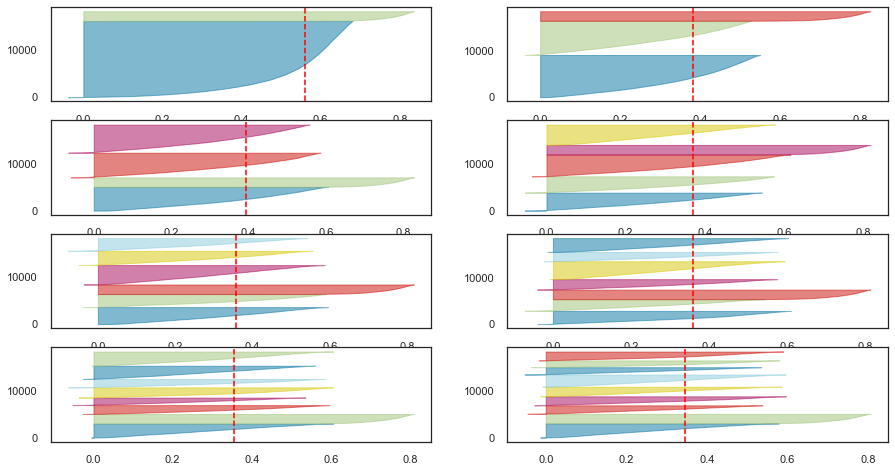

In [59]:
cluster_analysis(reduced,number_of_clusters=10)

<Figure size 720x720 with 0 Axes>

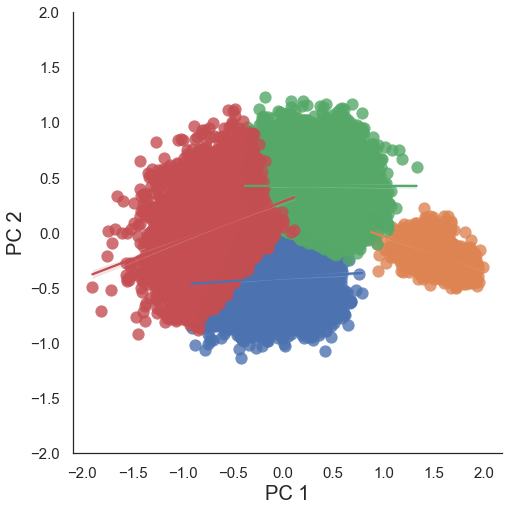

In [60]:
n_clusters=4
columns = ['x','y','z','cluster','name']
final_data=finalize_cluster(n_clusters,columns,reduced)
visualize_clusters(final_data)

In [61]:
visualize_3D(final_data)

### Without Normalizing Data

In [62]:
df = pd.read_csv('fifa_modified1.csv')
df.drop(columns=['sofifa_id','nationality','club','player_positions',
                         'preferred_foot','work_rate','body_type','real_face'],inplace=True)
    
names = df.short_name.tolist()
df.drop(columns=['short_name'],inplace=True)
x = df.values
pca = PCA(n_components=2)
reduced = pd.DataFrame(pca.fit_transform(x))
reduced = pd.DataFrame(reduced)

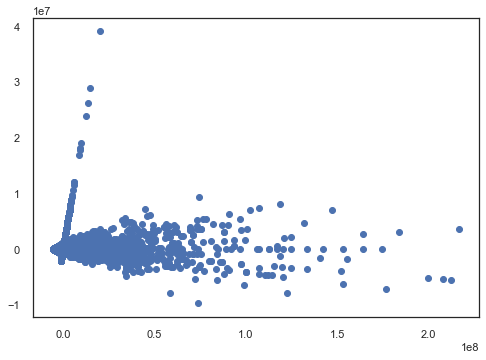

In [63]:
plt.scatter(reduced[0],reduced[1])

for 2 clusters silhoutte value is 0.8889212968107904 
for 3 clusters silhoutte value is 0.8154781144563947 
for 4 clusters silhoutte value is 0.7867513418842899 
for 5 clusters silhoutte value is 0.7644649448993874 


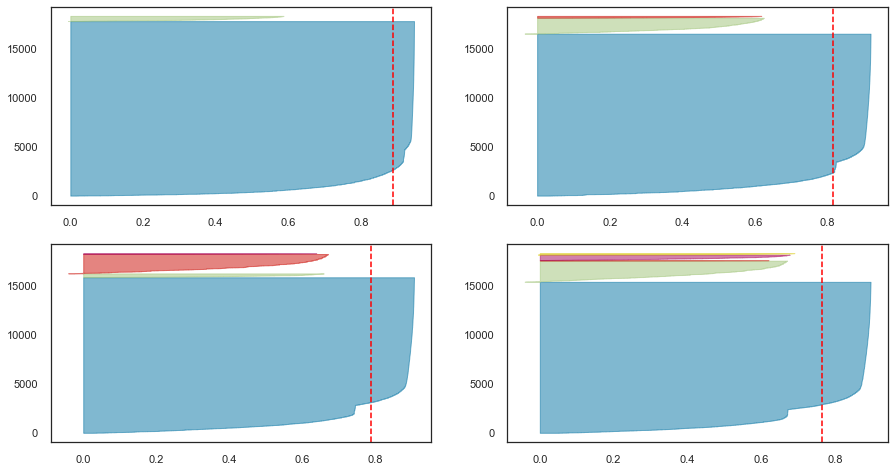

In [64]:
cluster_analysis(reduced,number_of_clusters=6)

### Actually the above result is skewed toward attributes which are having very high variance like val_eur, wage_eur release_clause_eur

In [65]:
# if we want to cluster players based on money they are earning then we don't have to normalize 